Final Project for Purdue ECE 57000 (Fall 2024)

This will run effeciently on CUDA & MacOS MPS backends but is very slow on CPU.

In [40]:
import sys
import warnings
from pathlib import Path
from typing import Dict, Any

!pip install opencv-python matplotlib timm rich

import cv2
import numpy as np
import torch
import torch.nn
import torch.utils.data
import torchvision
import matplotlib
import matplotlib.pyplot as plt

!{sys.executable} -m pip install git+https://github.com/ChaoningZhang/MobileSAM.git
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=FutureWarning)
    warnings.filterwarnings("ignore", category=UserWarning)
    from mobile_sam import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

# Edit python path to include src
sys.path.append("src")
import utils

  Cloning https://github.com/ChaoningZhang/MobileSAM.git to /private/var/folders/xq/rx8kt7mx02xfd87r07v219bm0000gn/T/pip-req-build-kz6_oudw
  Running command git clone --filter=blob:none --quiet https://github.com/ChaoningZhang/MobileSAM.git /private/var/folders/xq/rx8kt7mx02xfd87r07v219bm0000gn/T/pip-req-build-kz6_oudw
  Resolved https://github.com/ChaoningZhang/MobileSAM.git to commit c12dd83cbe26dffdcc6a0f9e7be2f6fb024df0ed
  Preparing metadata (setup.py) ... done


In [57]:
# Print setup
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("OpenCV version:", cv2.__version__)
print("Numpy version:", np.__version__)
print("Matplotlib version:", matplotlib.__version__)
print("Using device:", utils.get_device())
!pip freeze > frozen_requirements.txt

PyTorch version: 2.5.1
Torchvision version: 0.20.1
OpenCV version: 4.10.0
Numpy version: 2.1.3
Matplotlib version: 3.9.2
Using device: mps


# SAM Model Architecture

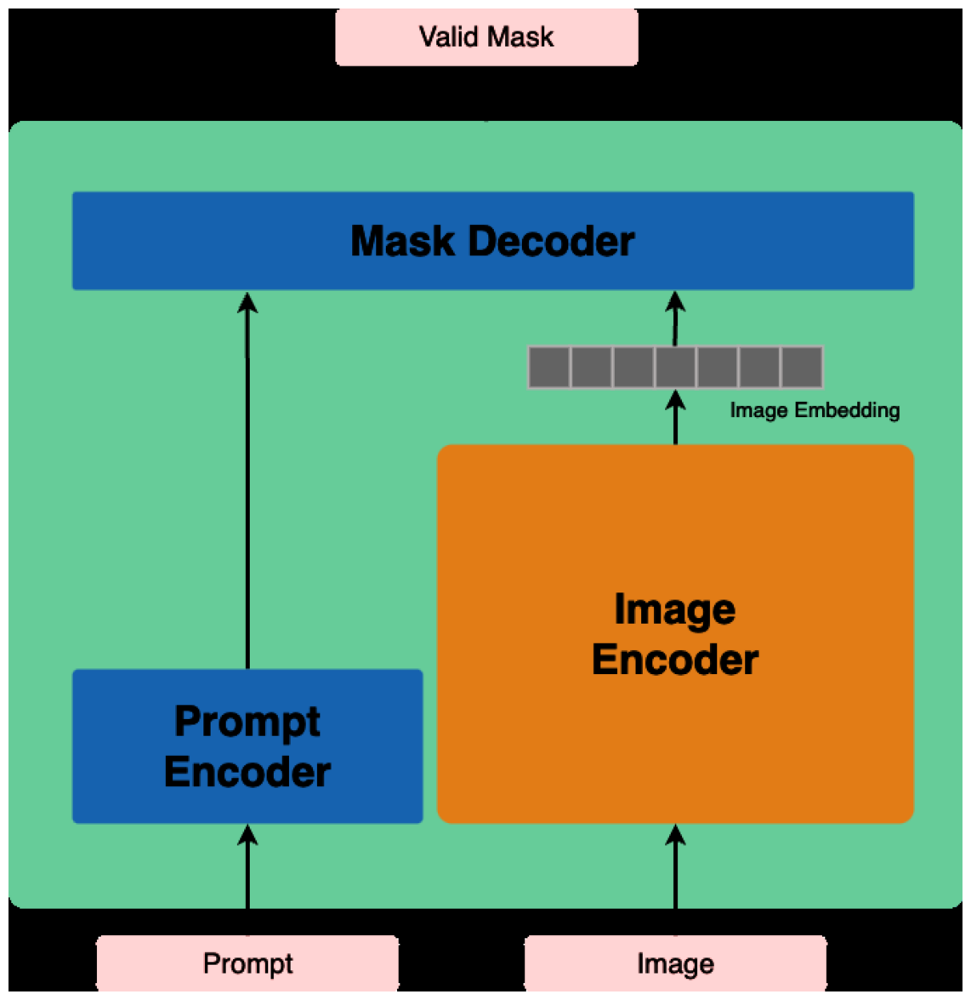

In [42]:
# insert an image
image_path = "SamArchitecture.png"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGRA2RGBA)
fig = plt.figure(figsize=(15, 15), frameon=False)
plt.axis('off')
plt.imshow(image)
plt.show()

# Load original SAM model pretrained checkpoint

In [43]:
# Download teacher model checkpoint if it does not exist
OG_VIT_CHECKPOINT_PATH = "weights/sam_vit_h_4b8939.pth"
OG_CHECKPOINT_URL = (
    "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
)

# Teacher model checkpoint is used for mask decoder and prompt encoder
# This can take a while, it's 2.56 GB
if not Path(OG_VIT_CHECKPOINT_PATH).exists():
    print("Downloading teacher model checkpoint from: ", OG_VIT_CHECKPOINT_PATH)
    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P weights

### NOTE: SEE src/train.py for the training script
This notebook is for demonstration of the training results. We will take a few sample images and use these to show examples of the custom trained model performance. We will then calculate the mIoU (mean Intersection over Union) as a more rigorous comparison of performance.

/var/folders/xq/rx8kt7mx02xfd87r07v219bm0000gn/T/ipykernel_200/2781734964.py:22: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


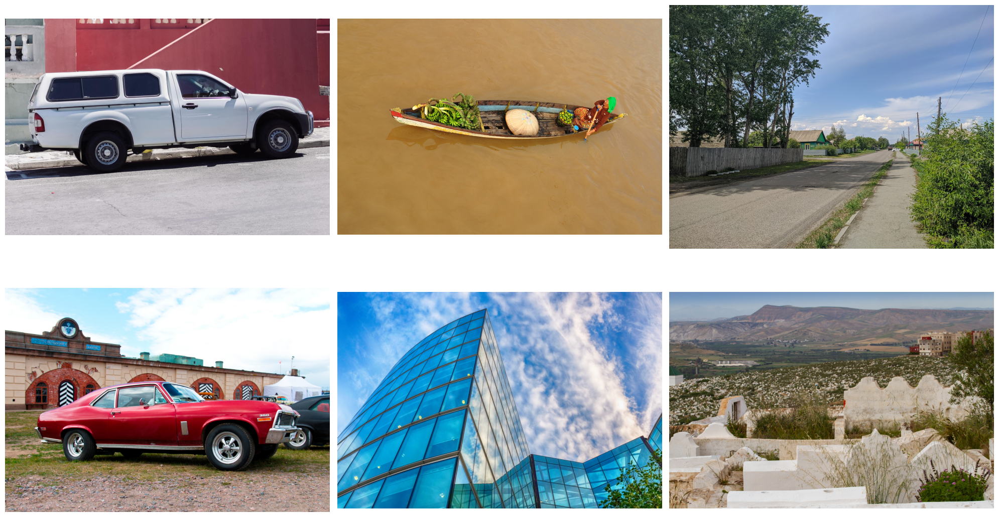

In [44]:
# Look at a few of the input image samples (note that the images are not all the same size)
images = [
    "samples/truck.jpg",
    "samples/car.jpg",
    "samples/boat.jpg",
    "samples/building.jpg",
    "samples/road.jpg",
    "samples/landscape.jpg",
]

fig, ax = plt.subplots(2, 3)
fig.set_size_inches(20, 12)

for i, image in enumerate(images):
    r = i % 2
    c = i // 2
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax[r][c].imshow(image)
    ax[r][c].axis("off")
plt.tight_layout()
fig.show()

The model that was trained, is just the image encoder component of the full SAM model. Thus, we need to merge the checkpoint with the original SAM model checkpoint.
The merged model is much smaller, 40MB compared to 2.56GB!

# Merge model checkpoints

In [45]:
CUSTOM_VIT_CHECKPOINT_PATH = "weights/ece570_x2.pth"
VIT_MERGED_CHECKPOINT_PATH = "weights/ece570_model_merged.pth"
with open(OG_VIT_CHECKPOINT_PATH, "rb") as f:
    teacher_state_dict = torch.load(f, weights_only=True)
with open(CUSTOM_VIT_CHECKPOINT_PATH, "rb") as f:
    student_state_dict = torch.load(f, weights_only=True)
merged_state_dict: Dict[str, Any] = {}
# Merge the two state dicts (replace the teacher image encoder with the student image encoder)
for key in teacher_state_dict.keys():
    if "image_encoder" not in key:
        merged_state_dict[key] = teacher_state_dict[key]
for key in student_state_dict.keys():
    if "image_encoder" in key:
        merged_state_dict[key] = student_state_dict[key]
# Save the merged state dict
with open(VIT_MERGED_CHECKPOINT_PATH, "wb") as f:
    torch.save(merged_state_dict, f)

In [46]:
# Helper function(s) for visualization
def show_anns(anns):
    if len(anns) == 0:
        return
    if "area" in anns[0]:
        sorted_anns = sorted(anns, key=(lambda x: x["area"]), reverse=True)
    else:
        sorted_anns = anns
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones(
        (
            sorted_anns[0]["segmentation"].shape[0],
            sorted_anns[0]["segmentation"].shape[1],
            4,
        )
    )
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann["segmentation"]
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

# Evaluate Original SAM model on grid of input points

In [47]:
# Use the SAM model Automatic Mask Generator to generate the mask and point_coords
OG_MODEL_TYPE = "vit_h"
print(f"Loading the original SAM model: {OG_MODEL_TYPE}")
og_sam = sam_model_registry[OG_MODEL_TYPE](checkpoint=OG_VIT_CHECKPOINT_PATH)
# Special handling for device here since Mac's MPS backend doesn't support the SAM model yet
# SEE: https://github.com/facebookresearch/segment-anything/issues/453
og_sam.to("cuda" if torch.cuda.is_available() else "cpu")
og_sam.eval()
print("Generating masks using the original SAM model")
generator = SamAutomaticMaskGenerator(og_sam)
og_masks = []
for i, image_path in enumerate(images):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    masks = generator.generate(image)
    num_masks = len(masks)
    print(f"Image: {image_path}, num masks: {num_masks}")
    og_masks.append(masks)

Loading the original SAM model: vit_h


/Users/crich/Development/School/ECE5700-AI/venv/lib/python3.12/site-packages/mobile_sam/build_sam.py:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.lo

Generating masks using the original SAM model
Image: samples/truck.jpg, num masks: 77
Image: samples/car.jpg, num masks: 102
Image: samples/boat.jpg, num masks: 28
Image: samples/building.jpg, num masks: 98
Image: samples/road.jpg, num masks: 52
Image: samples/landscape.jpg, num masks: 91


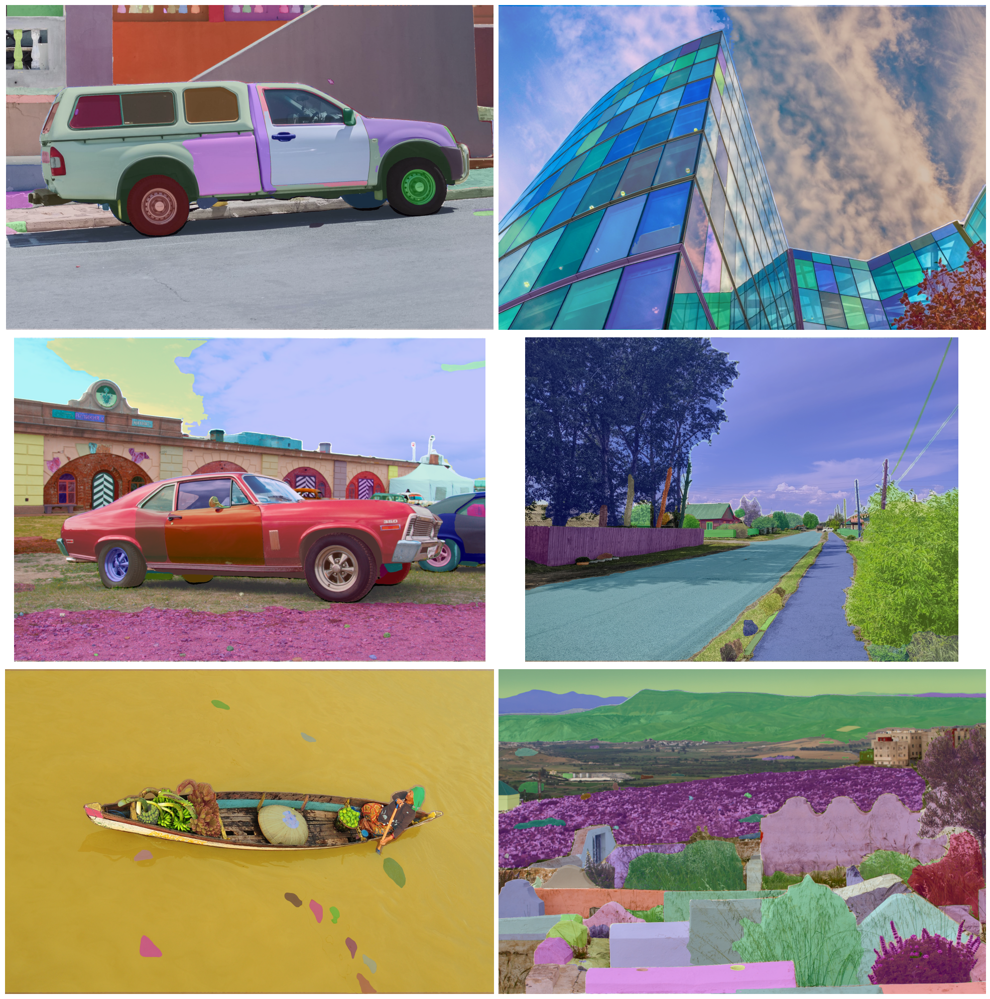

In [48]:
# Show the masks generated by the original SAM model
fig, ax = plt.subplots(3, 2, figsize=(20, 20))
i = 0
for img_pth, masks in zip(images, og_masks):
    r = i % 3
    c = i // 3
    image = cv2.imread(img_pth)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax[r][c].imshow(image)
    plt.sca(ax[r][c])
    plt.gca().axis("off")
    show_anns(masks)
    i += 1
plt.tight_layout()
plt.show()

In [49]:
# Helper function used to calculate the IoU (Intersection over Union)
def calculate_iou(pred, target):
    intersection = np.logical_and(target, pred)
    union = np.logical_or(target, pred)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

In [50]:
# Helper functions to visualize masks and points
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(
        pos_points[:, 0],
        pos_points[:, 1],
        color="green",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0],
        neg_points[:, 1],
        color="red",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )

# mIoU Calculation

In [51]:
# Now load the custom trained ViT Tiny model so we can generate masks using it and compare/calculate the mIoU
TINY_MODEL_TYPE = "vit_t"
print(f"Loading the TinyViT SAM model: {TINY_MODEL_TYPE}")
tiny_sam = sam_model_registry[TINY_MODEL_TYPE](checkpoint=VIT_MERGED_CHECKPOINT_PATH)
tiny_sam.to(utils.get_device())
tiny_sam.eval()
print("Generating masks using the ViT Tiny SAM model")
predictor = SamPredictor(tiny_sam)
count = 1
accum_iou = 0.0
show_masks = True
tiny_masks = []
for masks, img_path in zip(og_masks, images):
    image = cv2.imread(img_path)
    # ViT Tiny model only accepts RGB (it was only trained on this)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    predictor.set_image(image)
    tiny_masks_for_image = []
    for mask in masks:
        point_coords = np.array(mask["point_coords"])
        point_label = np.array([1])
        tiny_mask, _, _ = predictor.predict(
            point_coords=point_coords, point_labels=point_label, multimask_output=False
        )
        og_seg_mask = mask["segmentation"]
        tiny_seg_mask = tiny_mask.squeeze(0)
        tiny_masks_for_image.append({"segmentation": tiny_seg_mask})
        iou = calculate_iou(tiny_seg_mask, og_seg_mask)
        count += 1
        accum_iou += iou

        # DEBUG (show a single mask)
        # fig, ax = plt.subplots(1, 2, figsize=(20, 20))
        # ax[0].imshow(image)
        # show_mask(tiny_seg_mask, ax[0])
        # show_points(point_coords, point_label, ax[0])
        # ax[1].imshow(image)
        # show_mask(og_seg_mask, ax[1])
        # show_points(point_coords, point_label, ax[1])
        # plt.tight_layout()
        # fig.show()
        # plt.show()
    tiny_masks.append(tiny_masks_for_image)

meanIoU = accum_iou / count
print(f"mIoU: {meanIoU:.4f}")

Loading the TinyViT SAM model: vit_t


/Users/crich/Development/School/ECE5700-AI/venv/lib/python3.12/site-packages/mobile_sam/build_sam.py:91: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.loa

Generating masks using the ViT Tiny SAM model
mIoU: 0.6284


# Model parameter summary

In [52]:
# Print the number of parameters in the model
tiny_total_params = sum(p.numel() for p in tiny_sam.parameters())
print(f"Number of total parameters in the TinyViT based model: {tiny_total_params}")
# Print number of parameters in just the image encoder
tiny_image_encoder_params = sum(p.numel() for p in tiny_sam.image_encoder.parameters())
print(f"Number of parameters in the TinyViT image encoder: {tiny_image_encoder_params}")
# Print the total number of parameters in the original SAM model
og_total_params = sum(p.numel() for p in og_sam.parameters())
print(f"Number of total parameters in the original SAM model: {og_total_params}")
# Print number of parameters in just the image encoder
og_image_encoder_params = sum(p.numel() for p in og_sam.image_encoder.parameters())
print(f"Number of parameters in the original SAM image encoder: {og_image_encoder_params}")

Number of total parameters in the TinyViT based model: 10130092
Number of parameters in the TinyViT image encoder: 6065532
Number of total parameters in the original SAM model: 641090608
Number of parameters in the original SAM image encoder: 637026048


# Demo input and output of original SAM model

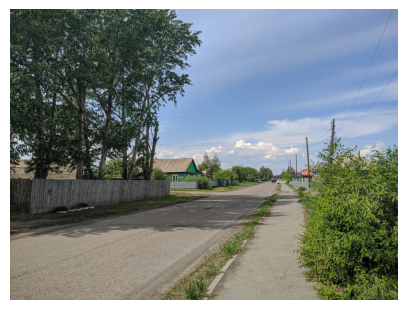

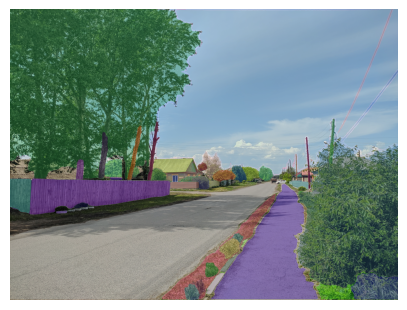

In [53]:
# Side-by-side comparison of the masks generated by the original SAM model and the input image
image_idx = 4
image = images[image_idx]
masks = og_masks[image_idx]
image = cv2.imread(image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig = plt.figure(frameon=False, figsize=(5, 5))
plt.imshow(image)
plt.axis("off")
plt.savefig("SamModelInput.png", bbox_inches="tight", pad_inches=0)

fig = plt.figure(frameon=False, figsize=(5, 5))
plt.imshow(image)
plt.axis("off")
show_anns(masks)
plt.savefig("SamModelMasks.png", bbox_inches="tight", pad_inches=0)

# Demo output from TinyViT based model (single input point)

In [54]:
import time

n = 5
image_idx = 1
image = images[image_idx]
point = np.array([[850, 900]])
point_lbl = np.array([1])
image = cv2.imread(image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Evaluate the TinyViT model on the same image
TINY_MODEL_TYPE = "vit_t"
print(f"Loading the TinyViT SAM model: {TINY_MODEL_TYPE}")
tiny_sam = sam_model_registry[TINY_MODEL_TYPE](checkpoint=VIT_MERGED_CHECKPOINT_PATH)
tiny_sam.to(utils.get_device())
tiny_sam.eval()
print("Generating single point mask using the ViT Tiny SAM model")
predictor = SamPredictor(tiny_sam)
start_time = time.time()
for _ in range(n):
    predictor.set_image(image)
    tiny_mask, _, _ = predictor.predict(point, point_lbl, multimask_output=False)
end_time = time.time()
delta_time = (end_time - start_time) / n
print(f"Time taken: {delta_time:.2f} seconds")

# Do the same for the original SAM model
OG_MODEL_TYPE = "vit_h"
print(f"Loading the original SAM model: {OG_MODEL_TYPE}")
og_sam = sam_model_registry[OG_MODEL_TYPE](checkpoint=OG_VIT_CHECKPOINT_PATH)
og_sam.to(utils.get_device())
og_sam.eval()
print("Generating single point mask using the original SAM model")
predictor = SamPredictor(og_sam)
start_time = time.time()
for _ in range(n):
    predictor.set_image(image)
    og_mask, _, _ = predictor.predict(point, point_lbl, multimask_output=False)
end_time = time.time()
delta_time = (end_time - start_time) / n
print(f"Time taken: {delta_time:.2f} seconds")


Loading the TinyViT SAM model: vit_t
Generating single point mask using the ViT Tiny SAM model
Time taken: 0.11 seconds
Loading the original SAM model: vit_h
Generating single point mask using the original SAM model
Time taken: 2.27 seconds


TinyViT Model


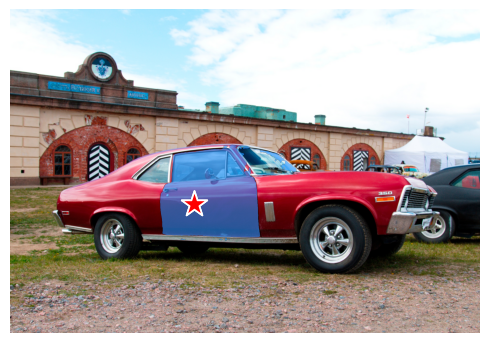

Original SAM Model


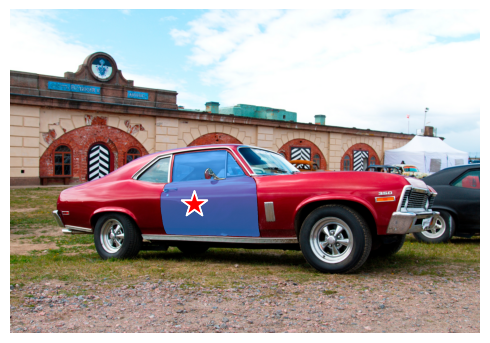

In [55]:
fig = plt.figure(figsize=(5, 5), frameon=False)
# plt.title("TinyViT Model")
print("TinyViT Model")
plt.imshow(image)
plt.axis("off")
show_mask(tiny_mask.squeeze(0), plt)
show_points([point], [1], plt)
plt.tight_layout()
plt.savefig("TinyViTModelSinglePointComparison.png", bbox_inches="tight", pad_inches=0)
plt.show()

fig = plt.figure(figsize=(5, 5), frameon=False)
# plt.title("Original SAM Model")
print("Original SAM Model")
plt.imshow(image)
plt.axis("off")
show_mask(og_mask.squeeze(0), plt)
show_points([point], [1], plt)
plt.tight_layout()
plt.savefig("SamModelSinglePointComparison.png", bbox_inches="tight", pad_inches=0)
plt.show()

# Demo output from TinyViT based model (grid of points)

TinyViT Model


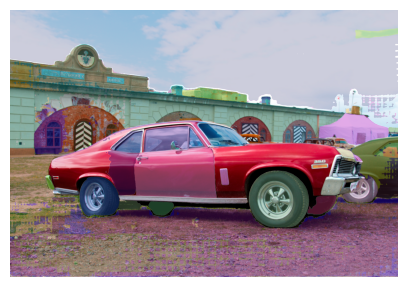

Original SAM Model


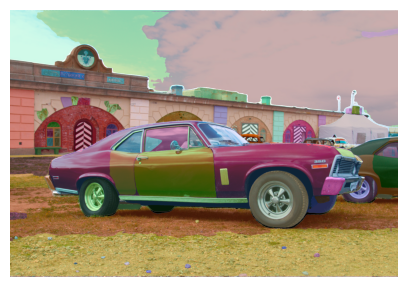

In [56]:
# Side-by-side comparison of the masks generated by the TinyViT model and the input image
image_idx = 1
image = images[image_idx]
sam_masks = og_masks[image_idx]
tiny_image_masks = tiny_masks[image_idx]
image = cv2.imread(image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig = plt.figure(frameon=False, figsize=(5, 5))
print("TinyViT Model")
plt.imshow(image)
plt.axis("off")
show_anns(tiny_image_masks)
plt.savefig("SamModelMultipointComparison.png", bbox_inches="tight", pad_inches=0)
plt.show()

fig = plt.figure(frameon=False, figsize=(5, 5))
print("Original SAM Model")
plt.imshow(image)
plt.axis("off")
show_anns(sam_masks)
plt.savefig("TinyViTModelMultipointComparison.png", bbox_inches="tight", pad_inches=0)
plt.show()